In [17]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model as earm
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns
from earm_exp_parameters_removednofit import earm_rates

In [2]:
os.chdir('/Users/Erin/git/puma_data/')

In [4]:
traces = {}
for trace in ['b', 'c']:
    traces[trace] = np.load('earm_mtdreamzs_3chain_expfix_4setgammalevels_25000burnin_fit_'+str(trace)+'1_sampled_params_chain_0.npy')
    #for cont in range(1, 3):
    #    old = traces[trace]
    #    traces[trace] = np.concatenate([old, np.load('earm_mtdreamzs_3chain_normal_'+str(trace)+str(cont)+'_sampled_params_chain_0.npy')])
    traces[trace] = [traces[trace]]
    for chain in range(1, 3):
        traces[trace].append(np.load('earm_mtdreamzs_3chain_expfix_4setgammalevels_25000burnin_fit_'+str(trace)+'1_sampled_params_chain_'+str(chain)+'.npy'))
        #for cont in range(1, 3):
        #    old = traces[trace][chain]
        #    traces[trace][chain] = np.concatenate([old, np.load('earm_mtdreamzs_3chain_normal_'+str(trace)+str(cont)+'_sampled_params_chain_'+str(chain)+'.npy')])

In [5]:
logps = {}
for trace in ['b', 'c']:
    logps[trace] = np.load('earm_mtdreamzs_3chain_expfix_4setgammalevels_25000burnin_fit_'+str(trace)+'1_logps_chain_0.npy')
    #for cont in range(1, 3):
    #    old = logps[trace]
    #    logps[trace] = np.concatenate([old, np.load('earm_mtdreamzs_3chain_normal_'+str(trace)+str(cont)+'_logps_chain_0.npy')])
    logps[trace] = [logps[trace]]
    for chain in range(1, 3):
        logps[trace].append(np.load('earm_mtdreamzs_3chain_expfix_4setgammalevels_25000burnin_fit_'+str(trace)+'1_logps_chain_'+str(chain)+'.npy'))
        #for cont in range(1, 3):
        #    old = logps[trace][chain]
        #    logps[trace][chain] = np.concatenate([old, np.load('earm_mtdreamzs_3chain_normal_'+str(trace)+str(cont)+'_logps_chain_'+str(chain)+'.npy')])

In [6]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['b', 'c']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [7]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  104  of  105  parameters.
Percent of parameters with GR below 1.2:  99.0476190476
Number of parameters with GR below 1.1:  99  of  105  parameters.
Percent of parameters with GR below 1.1:  94.2857142857


[104, 99.04761904761905, 99, 94.28571428571428]

In [8]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  101  of  105  parameters.
Percent of parameters with GR below 1.2:  96.1904761905
Number of parameters with GR below 1.1:  82  of  105  parameters.
Percent of parameters with GR below 1.1:  78.0952380952


[101, 96.19047619047619, 82, 78.0952380952381]

In [58]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  105  of  105  parameters.
Percent of parameters with GR below 1.2:  100.0
Number of parameters with GR below 1.1:  97  of  105  parameters.
Percent of parameters with GR below 1.1:  92.380952381


[105, 100.0, 97, 92.38095238095238]

In [59]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  103  of  105  parameters.
Percent of parameters with GR below 1.2:  98.0952380952
Number of parameters with GR below 1.1:  89  of  105  parameters.
Percent of parameters with GR below 1.1:  84.7619047619


[103, 98.09523809523809, 89, 84.76190476190476]

50000
3
50000


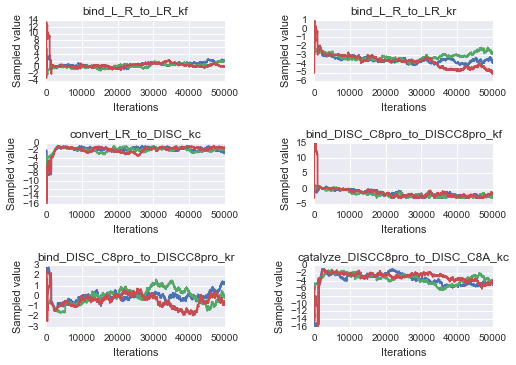

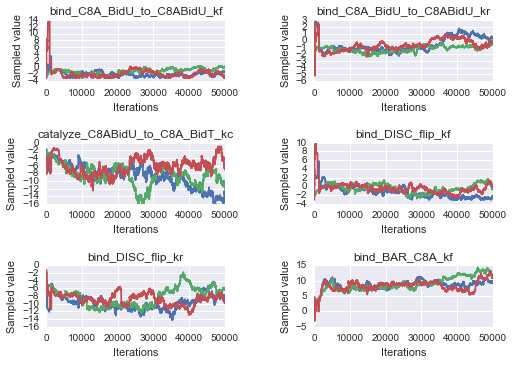

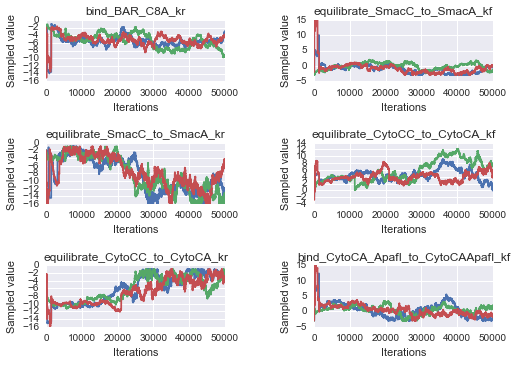

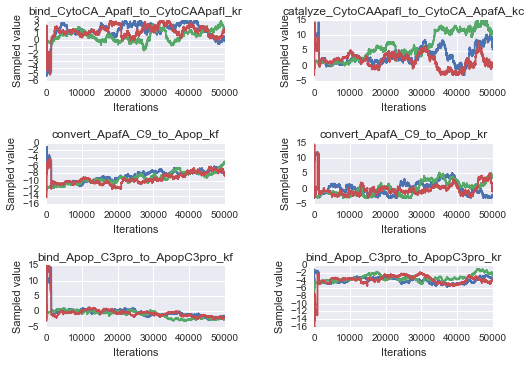

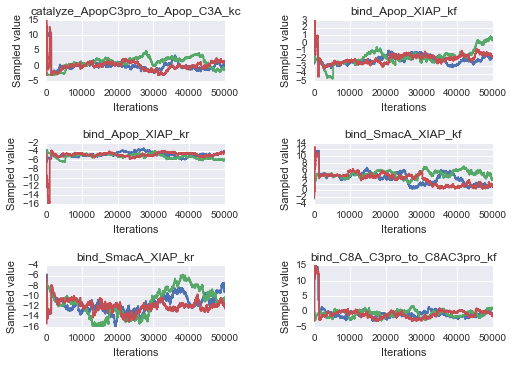

...

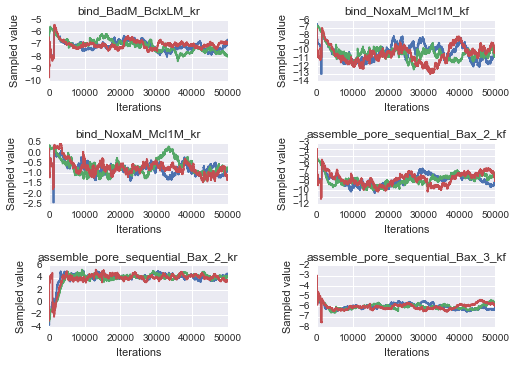

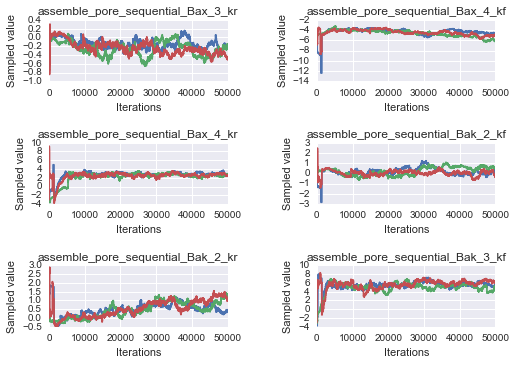

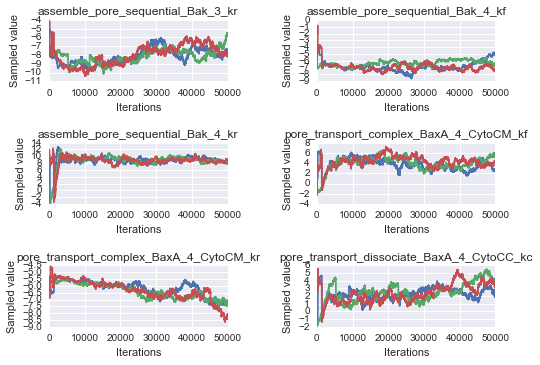

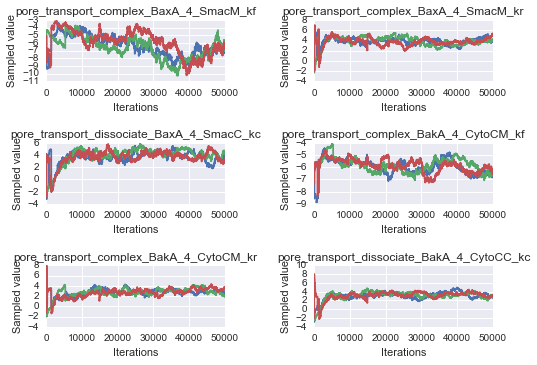

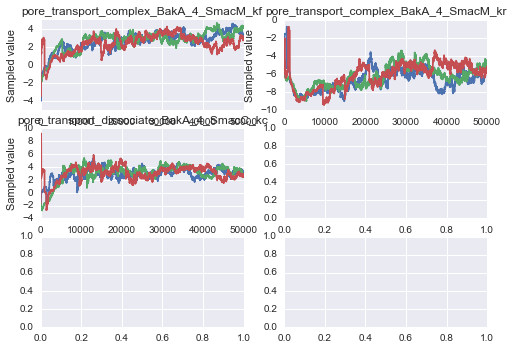

In [9]:
sample_plots(param_trace_dicts['b'])

50000
3
50000


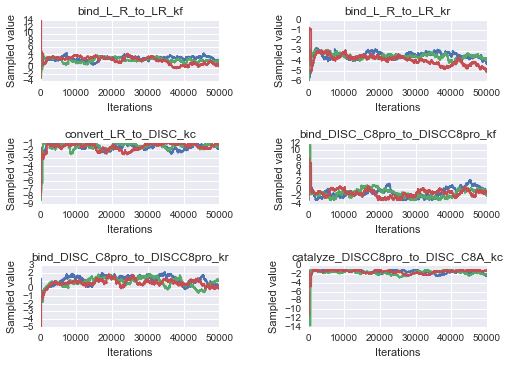

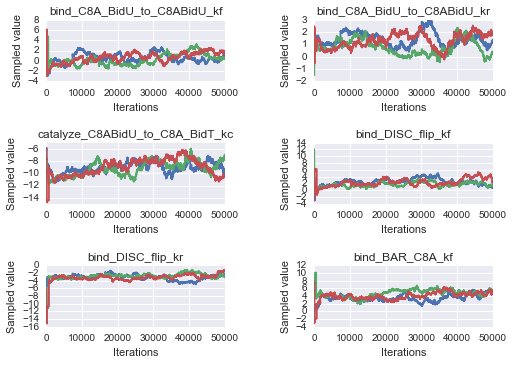

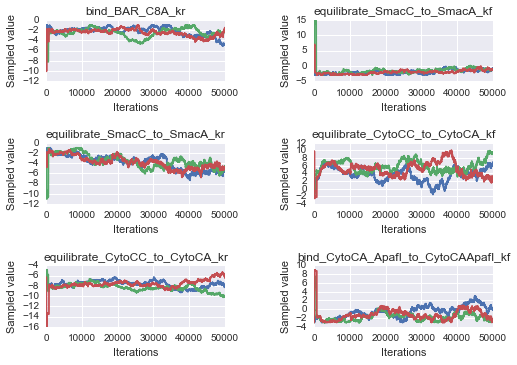

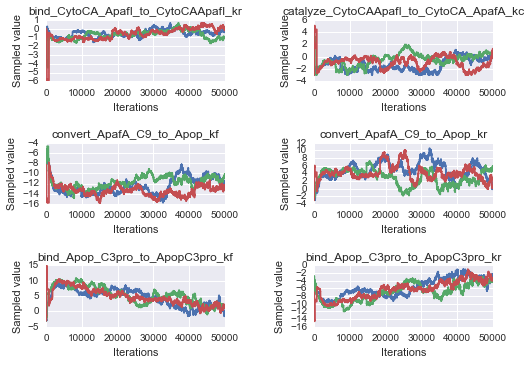

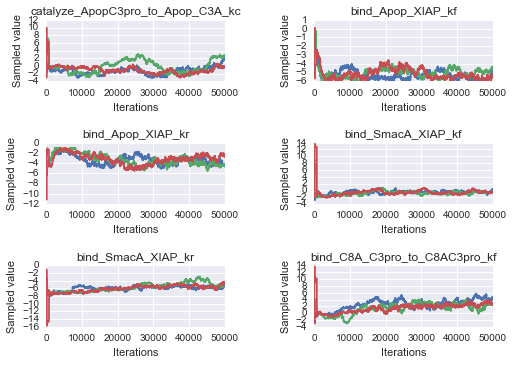

...

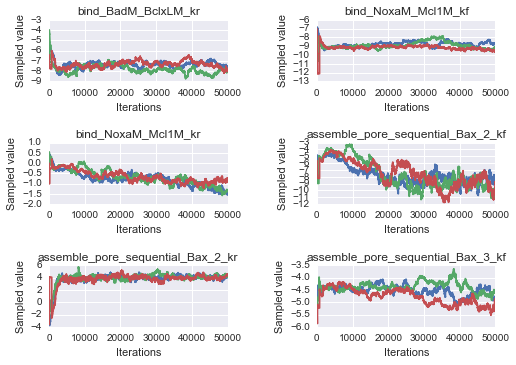

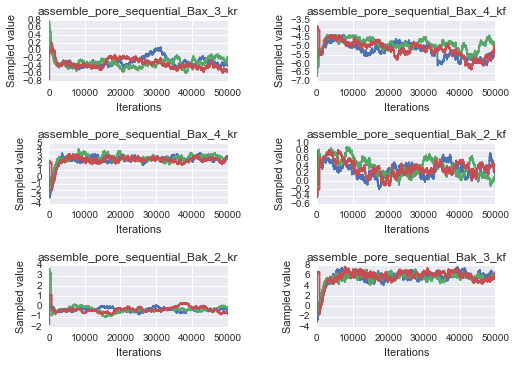

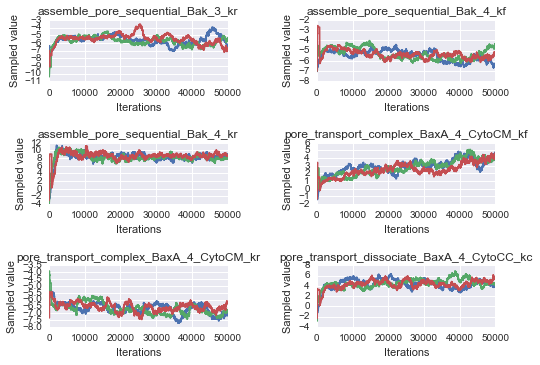

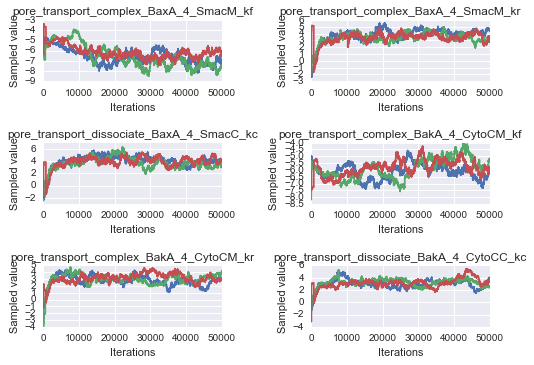

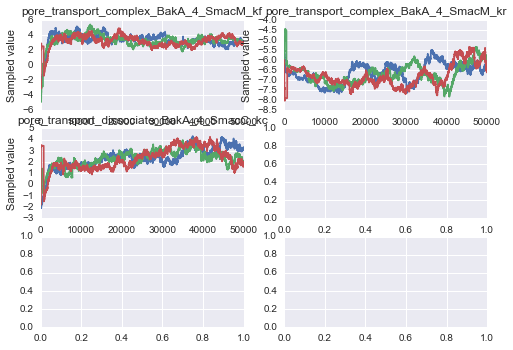

In [10]:
sample_plots(param_trace_dicts['c'])

In [11]:
#trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=25000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=25000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=25000, thin=1)
#trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=25000, thin=1)

In [12]:
trace_arr_c.shape

(75000, 105)

In [19]:
model_param_names = [param.name for param in earm.parameters_rules()]
param_mu = []
param_sd = []
norm_param_names = []
for param in earm.parameters_rules():
    if param.name in earm_rates:
        if earm_rates[param.name]['type'] == 'normal':
            if param.name in model_param_names:
                param_mu.append(np.log10(earm_rates[param.name]['mean']))
                param_sd.append(earm_rates[param.name]['sd'])
                norm_param_names.append(param.name)            

uniform_param_names = [param for param in model_param_names if param not in norm_param_names]
print 'norm param names: ',norm_param_names
print 'uniform param names: ',uniform_param_names
uniform_idxs = [i for i, param in enumerate(earm.parameters_rules()) if param.name in uniform_param_names]
norm_idxs = [i for i, param in enumerate(earm.parameters_rules()) if param.name in norm_param_names]

norm param names:  ['bind_L_R_to_LR_kf', 'convert_ApafA_C9_to_Apop_kf', 'catalyze_ApopC3pro_to_Apop_C3A_kc', 'bind_Apop_XIAP_kf', 'bind_Apop_XIAP_kr', 'bind_SmacA_XIAP_kf', 'catalyze_C8AC3pro_to_C8A_C3A_kc', 'bind_XIAP_C3A_to_XIAPC3A_kf', 'bind_XIAP_C3A_to_XIAPC3A_kr', 'catalyze_C3APARPU_to_C3A_PARPC_kc', 'catalyze_C3AC6pro_to_C3A_C6A_kc', 'bind_BidM_BaxC_to_BidMBaxC_kr', 'bind_BidM_BaxM_to_BidMBaxM_kf', 'bind_BidM_BakM_to_BidMBakM_kf', 'bind_BidM_BakM_to_BidMBakM_kr', 'bind_BidM_Bcl2M_kr', 'bind_BidM_BclxLM_kf', 'bind_BidM_BclxLM_kr', 'bind_BaxA_Bcl2_kf', 'bind_BaxA_Bcl2_kr', 'bind_BaxA_BclxLM_kr', 'bind_BakA_BclxLM_kf', 'bind_BakA_BclxLM_kr', 'bind_BadM_Bcl2_kr', 'bind_BadM_BclxLM_kr', 'bind_NoxaM_Mcl1M_kf', 'bind_NoxaM_Mcl1M_kr']
uniform param names:  ['bind_L_R_to_LR_kr', 'convert_LR_to_DISC_kc', 'bind_DISC_C8pro_to_DISCC8pro_kf', 'bind_DISC_C8pro_to_DISCC8pro_kr', 'catalyze_DISCC8pro_to_DISC_C8A_kc', 'bind_C8A_BidU_to_C8ABidU_kf', 'bind_C8A_BidU_to_C8ABidU_kr', 'catalyze_C8ABidU_t

In [22]:
ordered_idxs = uniform_idxs + norm_idxs
model = earm

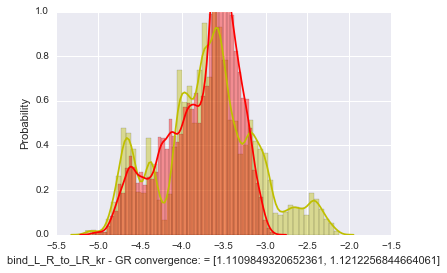

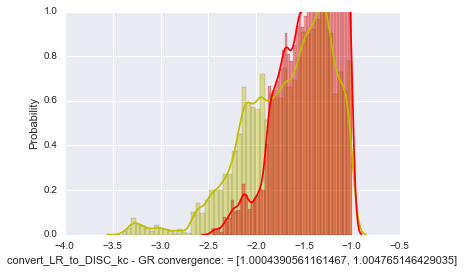

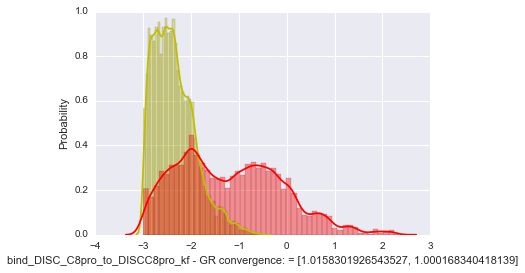

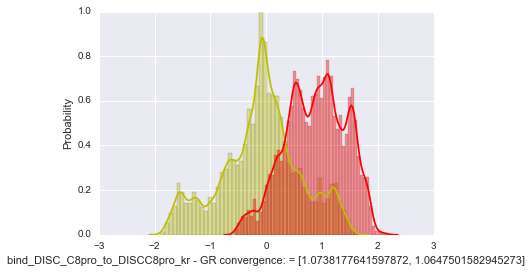

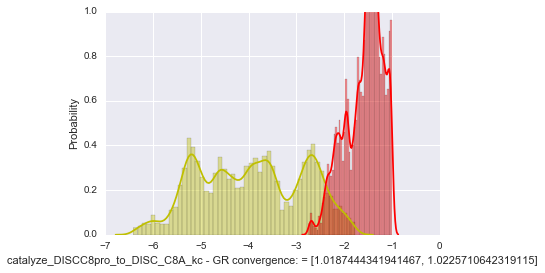

...

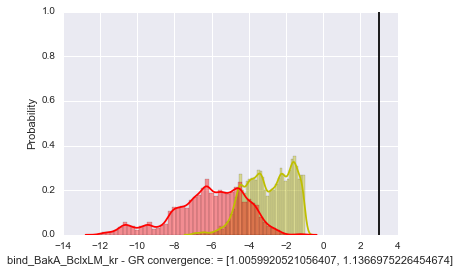

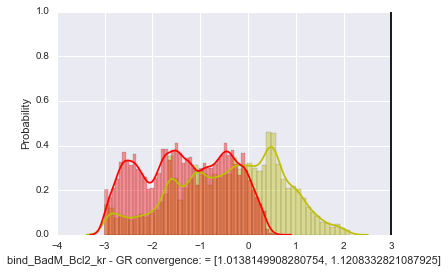

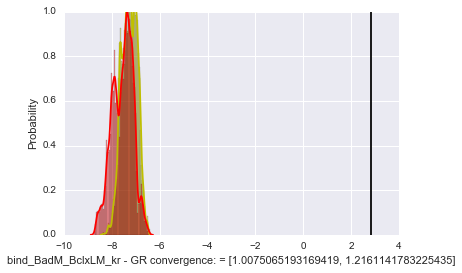

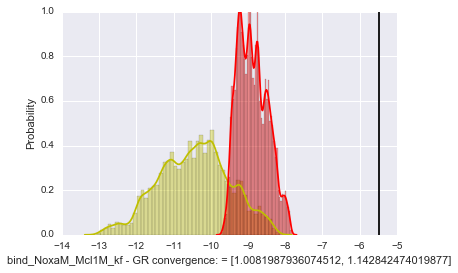

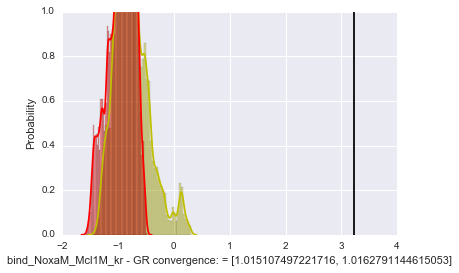

In [23]:
for dim in ordered_idxs:
    param_name = model.parameters_rules()[dim].name
    fig = plt.figure()
    sns.plotting_context('notebook')
    #ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    ax = sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    #sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    if param_name in earm_rates:
        if earm_rates[param_name]['type'] == 'normal':
            plt.vlines(x=np.log10(earm_rates[param_name]['mean']), ymin=0, ymax=1, label=earm_rates[param_name]['source'])
    ax.set_ylim(0, 1.0)
    convg_summary = [gelman_rubin_dicts[trace][param_name] for trace in ['b', 'c']]
    sns.axlabel(param_name+' - GR convergence: = '+str(convg_summary), 'Probability')

In [36]:
from scipy.stats import ks_2samp
from scipy.misc import comb

In [40]:
kstat = np.zeros((len(trace_arr_b[0]), int(comb(3, 2))))
pval = np.zeros((len(trace_arr_b[0]), int(comb(3, 2))))

In [42]:
trace_arrs = {}
#trace_arrs['a'] = trace_arr_a
trace_arrs['b'] = trace_arr_b
trace_arrs['c'] = trace_arr_c
trace_arrs['d'] = trace_arr_d
for dim in range(len(trace_arr_b[0])):
    for i, combo in enumerate([('b', 'c'), ('b', 'd'), ('c', 'd')]):
        kstat[dim, i], pval[dim, i] = ks_2samp(trace_arrs[combo[0]][:,dim], trace_arrs[combo[1]][:,dim])

In [44]:
pval

array([[  0.00000000e+000,   0.00000000e+000,   0.00000000e+000],
       [  0.00000000e+000,   0.00000000e+000,   0.00000000e+000],
       [  0.00000000e+000,   0.00000000e+000,   0.00000000e+000],
       [  0.00000000e+000,   0.00000000e+000,   0.00000000e+000],
       [  0.00000000e+000,   0.00000000e+000,   0.00000000e+000],
       [  0.00000000e+000,   0.00000000e+000,   0.00000000e+000],
       [  0.00000000e+000,   0.00000000e+000,   0.00000000e+000],
       [  0.00000000e+000,   0.00000000e+000,   0.00000000e+000],
       [  0.00000000e+000,   0.00000000e+000,   0.00000000e+000],
       [  0.00000000e+000,   0.00000000e+000,   0.00000000e+000],
       [  0.00000000e+000,   0.00000000e+000,   0.00000000e+000],
       [  0.00000000e+000,   0.00000000e+000,   0.00000000e+000],
       [  0.00000000e+000,   0.00000000e+000,   0.00000000e+000],
       [  0.00000000e+000,   0.00000000e+000,   0.00000000e+000],
       [  0.00000000e+000,   0.00000000e+000,   0.00000000e+000],
       [  

In [47]:
len(traces['a'][1][:,1])

KeyError: 'a'

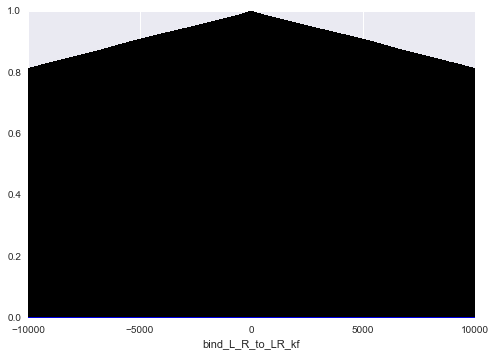

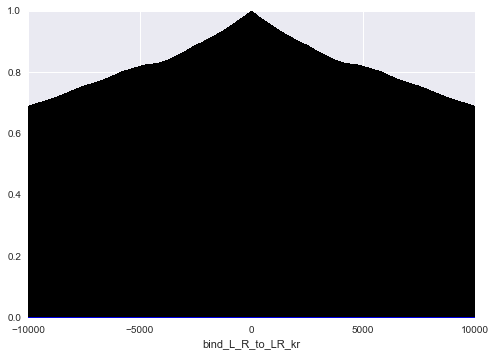

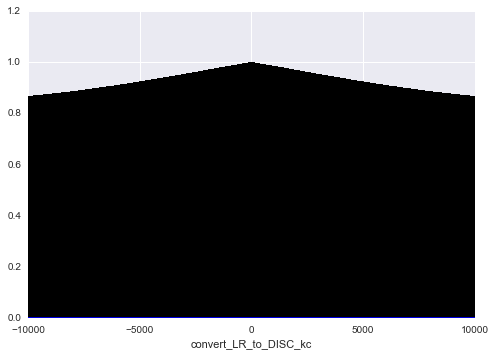

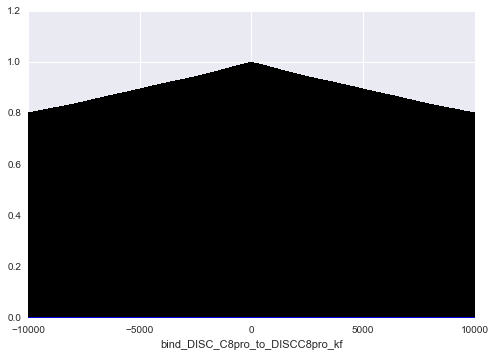

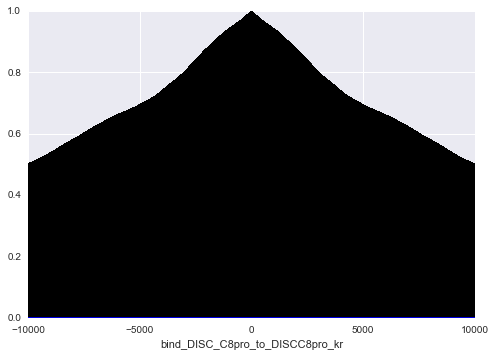

...

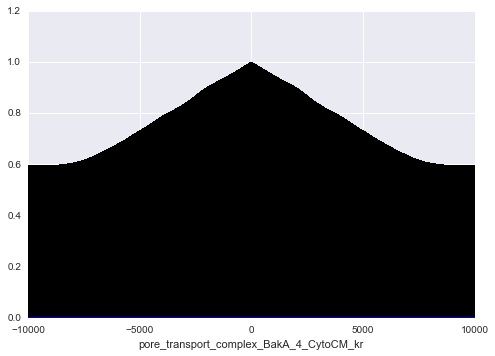

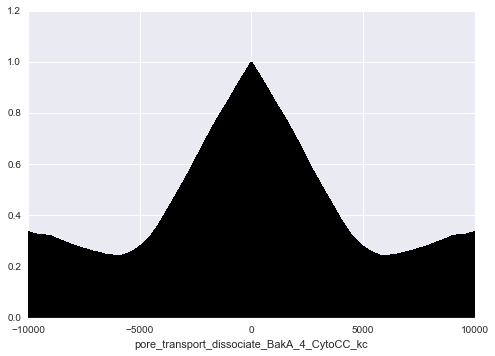

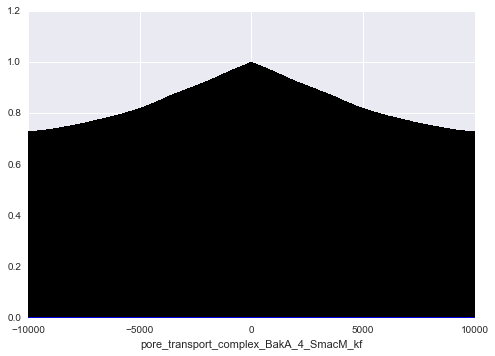

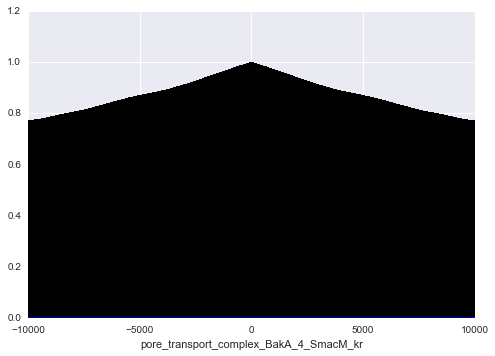

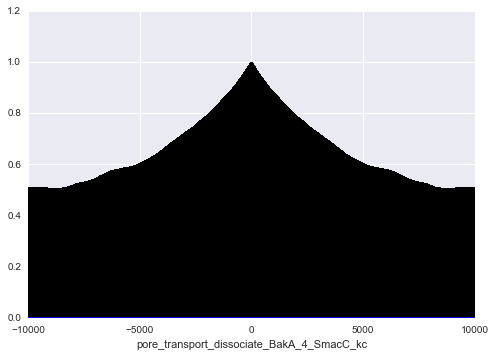

In [46]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['c'][0][25000:,dim], maxlags=10000)
    plt.xlabel(str(param_name))

In [ ]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['c'][1][25000::,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['c'][2][25000:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
os.chdir('/Users/Erin/git/emcee/')
from emcee import autocorr

In [ ]:
windows=15
integrated_autocorr_times = {}
for trace in ['a', 'b', 'c']:
    integrated_autocorr_times[trace] = {}
    for chain in range(12):
        integrated_autocorr_times[trace][chain] = np.zeros((windows, 105))
        window_length = int(len(traces[trace][chain][25000::])/windows)
        start = 25000
        for window in range(windows):
            end = start + window_length
            integrated_autocorr_times[trace][chain][window] = autocorr.integrated_time(traces[trace][chain][start:end], window=500)
            start = end
integrated_autocorr_times

In [ ]:
for trace in ['a', 'b', 'c']:
    for chain in range(3):
        for dim in range(105):
            if trace == 'a':
                plt.plot(range(15), integrated_autocorr_times[trace][chain][:,dim], 'b')
            elif trace == 'b':
                plt.plot(range(15), integrated_autocorr_times[trace][chain][:,dim], 'g')
            elif trace == 'c':
                plt.plot(range(15), integrated_autocorr_times[trace][chain][:,dim], 'y')

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [24]:
acceptance_rates = {}
vector_acceptance_rate = {}
running_acceptance_rates = {}
running_acceptance_rates_100window = {}
n_vector_acceptances = {}
n_100windowvec_acceptances = {}
running_acceptance_rates_vec = {}
running_acceptances_rates_vec_100window = {}
n_100window_acceptances = {}
n_acceptances = {}
for run in ['b', 'c', 'd']:
    acceptance_rates[run] = {}
    vector_acceptance_rate[run] = {}
    running_acceptance_rates[run] = {}
    running_acceptance_rates_100window[run] = {}
    n_vector_acceptances[run] = {}
    n_100windowvec_acceptances[run] = {}
    running_acceptance_rates_vec[run] = {}
    running_acceptances_rates_vec_100window[run] = {}
    n_100window_acceptances[run] = {}
    n_acceptances[run] = {}
    for chain in range(len(traces[run])):
        acceptance_rates[run][chain] = np.zeros((len(traces['b'][0][0],)))
        vector_acceptance_rate[run][chain] = 0
        running_acceptance_rates[run][chain] = np.zeros((len(traces['b'][0][0]), len(traces['b'][0])))
        running_acceptance_rates_100window[run][chain] = np.zeros((len(traces['b'][0][0]), 1000))
        n_vector_acceptances[run][chain] = 0
        n_100windowvec_acceptances[run][chain] = 0
        running_acceptance_rates_vec[run][chain] = np.zeros((1, len(traces['b'][0])))
        running_acceptances_rates_vec_100window[run][chain] = np.zeros((1, 1000))
        n_100window_acceptances[run][chain] = {}
        n_acceptances[run][chain] = {}
        for dim in range(len(traces[run][chain][0])):
            n_100window_acceptances[run][chain][dim] = 0
            n_acceptances[run][chain][dim] = 0
            for iteration in range(1, len(traces[run][chain])):
                if dim == 0:
                    comparison = traces[run][chain][iteration] == traces[run][chain][iteration-1]
                    if not np.all(comparison):
                        n_vector_acceptances[run][chain] += 1
                        n_100windowvec_acceptances[run][chain] += 1
                    running_acceptance_rates_vec[run][chain][0, iteration] = float(n_vector_acceptances[run][chain])/iteration
                    
                    if iteration % 100 == 0:
                        running_acceptances_rates_vec_100window[run][chain][0, iteration/100] = float(n_100windowvec_acceptances[run][chain])/100
                        n_100windowvec_acceptances[run][chain] = 0
                if traces[run][chain][iteration][dim] != traces[run][chain][iteration-1][dim]:
                    n_acceptances[run][chain][dim] += 1
                    n_100window_acceptances[run][chain][dim] += 1
                running_acceptance_rates[run][chain][dim, iteration] = float(n_acceptances[run][chain][dim])/iteration
        
                if iteration % 100 == 0:
                    running_acceptance_rates_100window[run][chain][dim, iteration/100] = float(n_100window_acceptances[run][chain][dim])/100
                    n_100window_acceptances[run][chain][dim] = 0
            
            acceptance_rates[run][chain][dim] = float(n_acceptances[run][chain][dim])/len(traces[run][chain])
            print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances[run][chain][dim]),' acceptance rate: ',str(acceptance_rates[run][chain][dim])
            print 'n vector acceptances: ',n_vector_acceptances[run][chain],' for run: ',run,' and chain: ',chain
            print 'Acceptance rate for vector: ',float(n_vector_acceptances[run][chain])/len(traces[run][chain]),' for run: ',run,' and chain: ',chain
running_acceptance_rates
running_acceptance_rates_100window
running_acceptance_rates_vec
running_acceptances_rates_vec_100window


N acceptances for parameter:  bind_L_R_to_LR_kf  =  20556  acceptance rate:  0.20556
n vector acceptances:  34880  for run:  b  and chain:  0
Acceptance rate for vector:  0.3488  for run:  b  and chain:  0
N acceptances for parameter:  bind_L_R_to_LR_kr  =  20998  acceptance rate:  0.20998
n vector acceptances:  34880  for run:  b  and chain:  0
Acceptance rate for vector:  0.3488  for run:  b  and chain:  0
N acceptances for parameter:  convert_LR_to_DISC_kc  =  19646  acceptance rate:  0.19646
n vector acceptances:  34880  for run:  b  and chain:  0
Acceptance rate for vector:  0.3488  for run:  b  and chain:  0
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  20266  acceptance rate:  0.20266
n vector acceptances:  34880  for run:  b  and chain:  0
Acceptance rate for vector:  0.3488  for run:  b  and chain:  0
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  21059  acceptance rate:  0.21059
n vector acceptances:  34880  for run:  b  and chain:  0
Ac

{'b': {0: array([[ 0.  ,  0.18,  0.06,  0.11,  0.04,  0.04,  0.08,  0.06,  0.03,
           0.09,  0.15,  0.14,  0.11,  0.19,  0.16,  0.16,  0.14,  0.13,
           0.17,  0.19,  0.2 ,  0.17,  0.24,  0.26,  0.25,  0.27,  0.32,
           0.29,  0.26,  0.35,  0.29,  0.29,  0.28,  0.36,  0.28,  0.37,
           0.26,  0.34,  0.35,  0.33,  0.42,  0.19,  0.34,  0.31,  0.31,
           0.35,  0.34,  0.33,  0.38,  0.35,  0.4 ,  0.37,  0.34,  0.44,
           0.34,  0.39,  0.36,  0.36,  0.34,  0.37,  0.35,  0.28,  0.41,
           0.36,  0.31,  0.32,  0.33,  0.29,  0.34,  0.35,  0.29,  0.34,
           0.31,  0.38,  0.38,  0.32,  0.35,  0.33,  0.36,  0.36,  0.36,
           0.38,  0.36,  0.33,  0.37,  0.32,  0.44,  0.31,  0.42,  0.29,
           0.29,  0.26,  0.32,  0.3 ,  0.4 ,  0.23,  0.36,  0.34,  0.35,
           0.45,  0.44,  0.31,  0.44,  0.42,  0.38,  0.31,  0.4 ,  0.36,
           0.26,  0.42,  0.38,  0.37,  0.36,  0.41,  0.36,  0.43,  0.38,
           0.38,  0.34,  0.39,  0.44,  0.41

In [37]:
running_acceptances_rates_vec_100window['a'][0][0,:]

array([ 0.  ,  0.22,  0.12,  0.1 ,  0.11,  0.12,  0.08,  0.18,  0.09,
        0.13,  0.06,  0.15,  0.15,  0.12,  0.17,  0.17,  0.16,  0.19,
        0.16,  0.23,  0.19,  0.24,  0.18,  0.2 ,  0.19,  0.14,  0.25,
        0.21,  0.18,  0.2 ,  0.17,  0.14,  0.19,  0.12,  0.27,  0.24,
        0.2 ,  0.29,  0.23,  0.21,  0.26,  0.24,  0.2 ,  0.18,  0.31,
        0.2 ,  0.2 ,  0.23,  0.28,  0.26,  0.24,  0.19,  0.24,  0.3 ,
        0.35,  0.31,  0.37,  0.31,  0.39,  0.26,  0.24,  0.33,  0.3 ,
        0.29,  0.32,  0.37,  0.33,  0.28,  0.33,  0.34,  0.32,  0.31,
        0.39,  0.3 ,  0.2 ,  0.33,  0.31,  0.34,  0.29,  0.23,  0.35,
        0.32,  0.21,  0.26,  0.24,  0.25,  0.24,  0.24,  0.32,  0.25,
        0.27,  0.23,  0.16,  0.25,  0.32,  0.27,  0.2 ,  0.32,  0.26,
        0.3 ,  0.28,  0.31,  0.32,  0.3 ,  0.33,  0.25,  0.29,  0.29,
        0.26,  0.26,  0.3 ,  0.28,  0.32,  0.27,  0.33,  0.36,  0.36,
        0.33,  0.3 ,  0.31,  0.31,  0.23,  0.23,  0.33,  0.37,  0.36,
        0.25,  0.31,

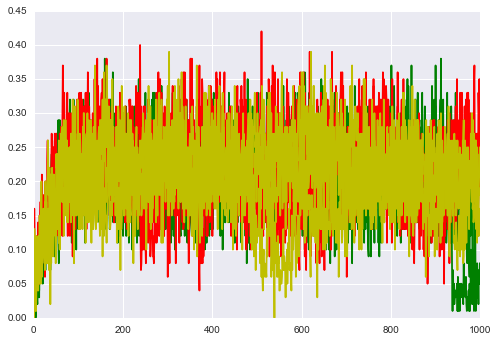

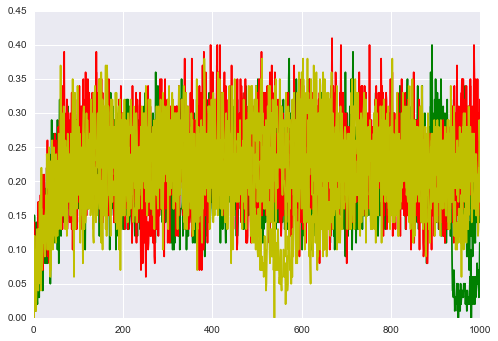

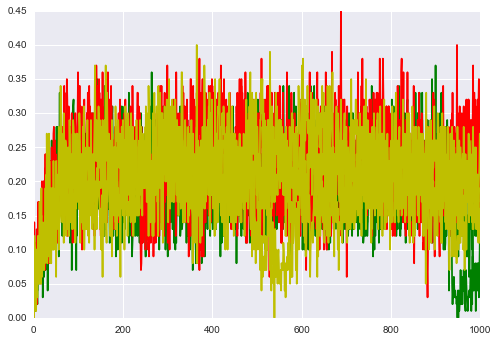

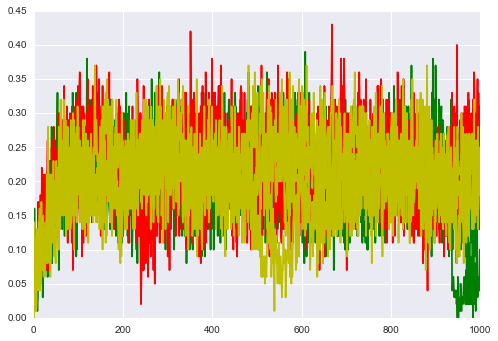

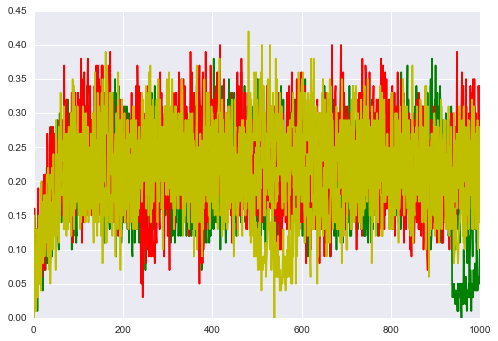

...

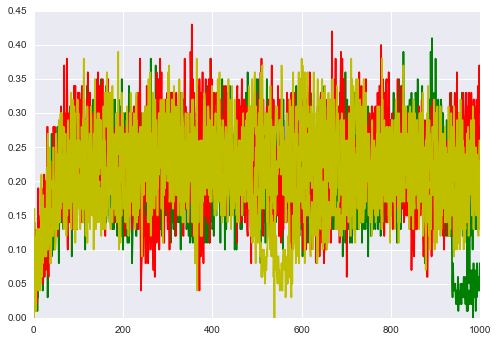

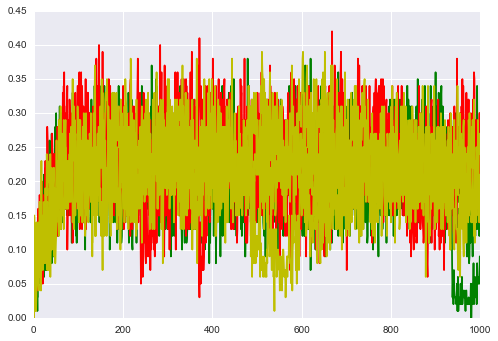

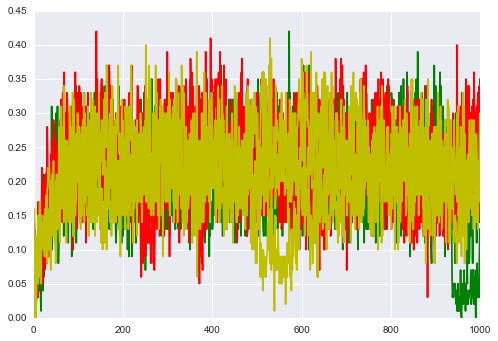

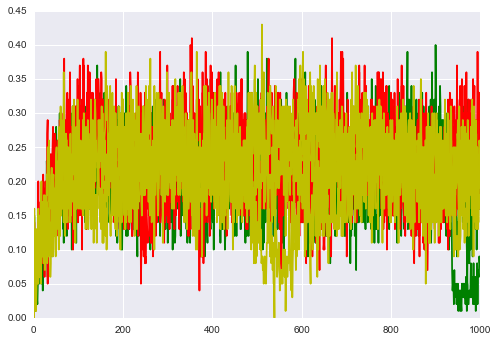

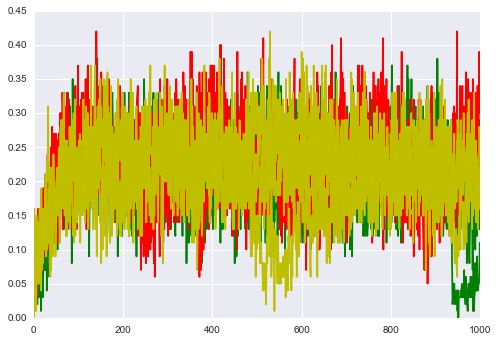

In [26]:
for dim in range(105):
    plt.figure()
    for run in ['b', 'c', 'd']:
        for chain in range(len(traces[run])):
            if run == 'a':
                plt.plot(range(1000), running_acceptance_rates_100window[run][chain][dim, :], 'b')
            elif run == 'b':
                plt.plot(range(1000), running_acceptance_rates_100window[run][chain][dim, :], 'g')
            elif run == 'c':
                plt.plot(range(1000), running_acceptance_rates_100window[run][chain][dim, :], 'r')
            elif run == 'd':
                plt.plot(range(1000), running_acceptance_rates_100window[run][chain][dim, :], 'y')

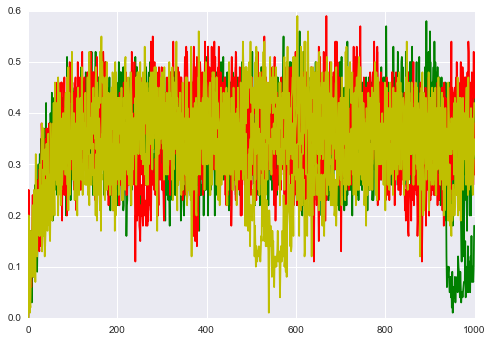

In [27]:
for run in ['b', 'c', 'd']:
        for chain in range(len(traces[run])):
            if run == 'a':
                plt.plot(range(1000), running_acceptances_rates_vec_100window[run][chain][0,:], 'b')
            elif run == 'b':
                plt.plot(range(1000), running_acceptances_rates_vec_100window[run][chain][0,:], 'g')
            elif run == 'c':
                plt.plot(range(1000), running_acceptances_rates_vec_100window[run][chain][0,:], 'r')
            elif run == 'd':
                plt.plot(range(1000), running_acceptances_rates_vec_100window[run][chain][0,:], 'y')